# Navier–Stokes in 12 Easy Steps (Computational Workflow)

This notebook is a **hands-on CFD mini-course** inspired by the classic *CFDPython* “12 steps” series.
It walks from simple 1D advection all the way to **2D incompressible Navier–Stokes** (cavity flow) and **channel flow**.

## What you’ll learn
- How to discretize PDEs with **finite differences**
- How to reason about **stability (CFL)** and **numerical diffusion**
- How the **pressure Poisson equation** enforces incompressibility
- A reusable workflow: *model → discretize → implement → verify/visualize*

> **Conventions**
> - Spatial grid: uniform, Cartesian
> - Time stepping: explicit (Forward Euler) unless noted
> - Boundary conditions: stated per step
> - Arrays are indexed as `u[j, i]` with **`j` = y-index** and **`i` = x-index**

---

### Setup
Run the next cell to import dependencies and define helper plotting functions used throughout.


In [1]:
import sys
!{sys.executable} -m pip install -U numpy matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 kB 2.7 MB/s eta 0:00:00
  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.2/114.2 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 46.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.1/8.1 MB 45.9 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 253.4/253.4 kB 31.7 MB/s eta 0:00:00
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 49.9 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.3/65.3 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 51.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.8/122.8 kB 18.1 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installa

In [15]:
# Core scientific stack
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

# Nicer inline figures (works in Jupyter/Quarto)
# If you run this as a .py script, you can remove the next line.
%config InlineBackend.figure_formats = ['svg']

plt.rcParams.update({
    "figure.figsize": (6, 5),
    "figure.dpi": 300,
    "axes.grid": True,
    "axes.spines.top": False,
    "axes.spines.right": False,
})

def plot1d(x, u, title="", xlabel="x", ylabel="u"):
    """Quick 1D line plot."""
    fig, ax = plt.subplots()
    ax.plot(x, u, lw=2)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    fig.tight_layout()
    plt.show()

def plot2d_contour(X, Y, Z, title="", xlabel="x", ylabel="y", cmap=cm.viridis):
    """2D filled contour plot with colorbar."""
    fig, ax = plt.subplots()
    c = ax.contourf(X, Y, Z, levels=50, cmap=cmap)
    fig.colorbar(c, ax=ax, shrink=0.85)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_aspect("equal", adjustable="box")
    fig.tight_layout()
    plt.show()

def plot2d_surface(X, Y, Z, title="", xlabel="x", ylabel="y", zlabel=""):
    """3D surface plot (robust across Matplotlib versions)."""
    fig = plt.figure(figsize=(11, 7), dpi=110)
    ax = fig.add_subplot(111, projection="3d")  # reliable vs fig.gca(projection='3d')
    surf = ax.plot_surface(X, Y, Z, cmap=cm.viridis, rstride=1, cstride=1,
                           linewidth=0, antialiased=True)
    fig.colorbar(surf, ax=ax, shrink=0.6, pad=0.08)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    if zlabel:
        ax.set_zlabel(zlabel)
    fig.tight_layout()
    plt.show()

def cfl_number(c, dt, dx):
    """CFL number for 1D advection-like terms."""
    return c * dt / dx


## Step 1 — 1D Linear Convection

We start with the simplest hyperbolic PDE:


$$\frac{\partial u}{\partial t} + c\,\frac{\partial u}{\partial x} = 0$$

where **`c`** is a constant wave speed. This equation transports the profile to the right (for `c>0`) without changing its shape (in the continuous limit).

### Discretization (Forward Euler + backward difference)
For stability with `c>0`, we use an **upwind** (backward) difference:

$$
u_i^{n+1} = u_i^n - c\,\frac{\Delta t}{\Delta x}\left(u_i^n-u_{i-1}^n\right).
$$

### Boundary conditions
We hold the left boundary fixed (`u[0]=1`), and the right boundary is also kept at `1` for this demo.


CFL = 0.20000000000000004


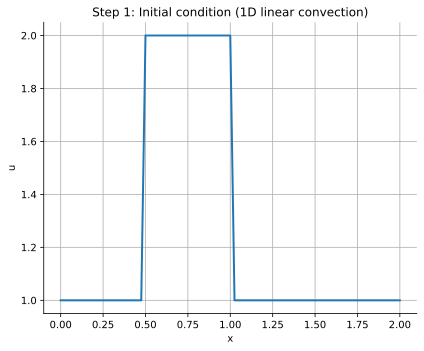

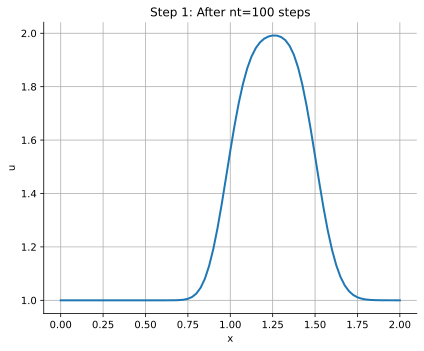

In [16]:
# --- Parameters ---
nx = 81
nt = 100
c = 1.0
dx = 2.0 / (nx - 1)
sigma = 0.2                     # CFL-like safety factor
dt = sigma * dx / c             # choose dt from dx and c

print("CFL =", cfl_number(c, dt, dx))

# --- Grid ---
x = np.linspace(0, 2, nx)

# --- Initial condition: "hat" function ---
u = np.ones(nx)
u[int(0.5 / dx):int(1.0 / dx) + 1] = 2.0

plot1d(x, u, title="Step 1: Initial condition (1D linear convection)")

# --- Time integration ---
for n in range(nt):
    un = u.copy()
    # Update interior points; i=0 is boundary
    u[1:] = un[1:] - c * dt / dx * (un[1:] - un[:-1])

    # Boundary conditions
    u[0] = 1.0
    u[-1] = 1.0

plot1d(x, u, title=f"Step 1: After nt={nt} steps")


## Step 2 — 1D Nonlinear Convection

Now the wave speed depends on the solution:

$$
\frac{\partial u}{\partial t} + u\,\frac{\partial u}{\partial x} = 0.
$$

This creates **steepening**: higher values move faster, potentially forming shocks.

### Discretization (upwind)
$$
u_i^{n+1} = u_i^n - u_i^n\,\frac{\Delta t}{\Delta x}\left(u_i^n-u_{i-1}^n\right).
$$

We again use a backward difference (upwind) for stability.


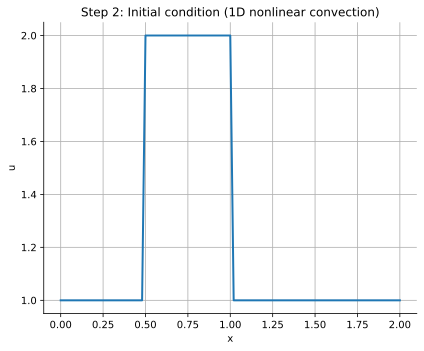

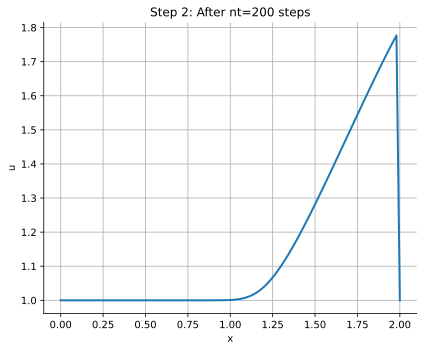

In [17]:
nx = 101
nt = 200
dx = 2.0 / (nx - 1)
dt = 0.2 * dx                   # simple choice; for robustness you can use dt ~ dx / max(u)

x = np.linspace(0, 2, nx)
u = np.ones(nx)
u[int(0.5 / dx):int(1.0 / dx) + 1] = 2.0

plot1d(x, u, title="Step 2: Initial condition (1D nonlinear convection)")

for n in range(nt):
    un = u.copy()
    u[1:] = un[1:] - un[1:] * dt / dx * (un[1:] - un[:-1])
    u[0] = 1.0
    u[-1] = 1.0

plot1d(x, u, title=f"Step 2: After nt={nt} steps")


## Step 3 — 1D Diffusion

Diffusion smooths gradients:

$$
\frac{\partial u}{\partial t} = \nu\,\frac{\partial^2 u}{\partial x^2},
$$
where **`ν`** is the diffusion coefficient (viscosity in fluid contexts).

### Discretization (Forward Euler + centered second derivative)
$$
u_i^{n+1} = u_i^n + \nu\,\frac{\Delta t}{\Delta x^2}\left(u_{i+1}^n - 2u_i^n + u_{i-1}^n\right).
$$

### Stability (important!)
For explicit diffusion in 1D, a typical condition is:

$$
\nu\,\frac{\Delta t}{\Delta x^2} \le \frac{1}{2}.
$$


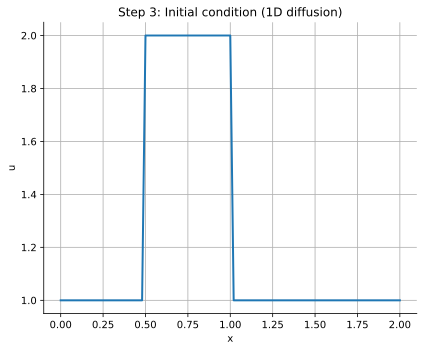

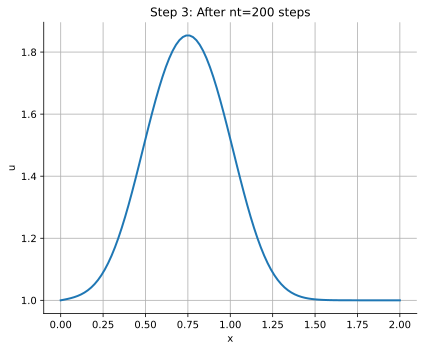

In [18]:
nx = 101
nt = 200
nu = 0.3
dx = 2.0 / (nx - 1)
sigma = 0.2
dt = sigma * dx**2 / nu         # stable explicit diffusion step

x = np.linspace(0, 2, nx)
u = np.ones(nx)
u[int(0.5 / dx):int(1.0 / dx) + 1] = 2.0

plot1d(x, u, title="Step 3: Initial condition (1D diffusion)")

for n in range(nt):
    un = u.copy()
    u[1:-1] = un[1:-1] + nu * dt / dx**2 * (un[2:] - 2*un[1:-1] + un[:-2])
    u[0] = 1.0
    u[-1] = 1.0

plot1d(x, u, title=f"Step 3: After nt={nt} steps")


## Step 4 — 1D Burgers’ Equation (nonlinear convection + diffusion)

Burgers combines the previous two effects:

$$
\frac{\partial u}{\partial t} + u\,\frac{\partial u}{\partial x} = \nu\,\frac{\partial^2 u}{\partial x^2}.
$$

It is a standard playground for shock formation (from nonlinearity) regularized by viscosity (diffusion).

### Discretization
- Nonlinear convection term: upwind
- Diffusion term: centered second derivative


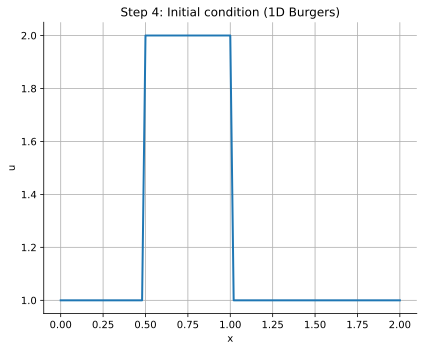

/var/folders/l_/_p2_9s4x6sgbl7sh8tjclkyc0000gn/T/ipykernel_15673/1776893760.py:16: RuntimeWarning: overflow encountered in multiply
  - un[1:-1] * dt/dx * (un[1:-1] - un[:-2])
/var/folders/l_/_p2_9s4x6sgbl7sh8tjclkyc0000gn/T/ipykernel_15673/1776893760.py:16: RuntimeWarning: invalid value encountered in subtract
  - un[1:-1] * dt/dx * (un[1:-1] - un[:-2])
/var/folders/l_/_p2_9s4x6sgbl7sh8tjclkyc0000gn/T/ipykernel_15673/1776893760.py:15: RuntimeWarning: invalid value encountered in subtract
  u[1:-1] = (un[1:-1]
/var/folders/l_/_p2_9s4x6sgbl7sh8tjclkyc0000gn/T/ipykernel_15673/1776893760.py:17: RuntimeWarning: invalid value encountered in subtract
  + nu * dt/dx**2 * (un[2:] - 2*un[1:-1] + un[:-2]))
/var/folders/l_/_p2_9s4x6sgbl7sh8tjclkyc0000gn/T/ipykernel_15673/1776893760.py:17: RuntimeWarning: invalid value encountered in add
  + nu * dt/dx**2 * (un[2:] - 2*un[1:-1] + un[:-2]))
/var/folders/l_/_p2_9s4x6sgbl7sh8tjclkyc0000gn/T/ipykernel_15673/1776893760.py:15: RuntimeWarning: invalid va

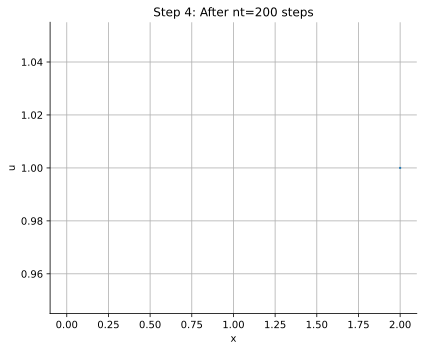

In [19]:
nx = 101
nt = 200
nu = 0.07
dx = 2.0 / (nx - 1)
dt = 0.2 * dx                   # keep small; for shocks you may need smaller dt

x = np.linspace(0, 2, nx)
u = np.ones(nx)
u[int(0.5 / dx):int(1.0 / dx) + 1] = 2.0

plot1d(x, u, title="Step 4: Initial condition (1D Burgers)")

for n in range(nt):
    un = u.copy()
    u[1:-1] = (un[1:-1]
               - un[1:-1] * dt/dx * (un[1:-1] - un[:-2])
               + nu * dt/dx**2 * (un[2:] - 2*un[1:-1] + un[:-2]))
    u[0] = 1.0
    u[-1] = 1.0

plot1d(x, u, title=f"Step 4: After nt={nt} steps")


## Step 5 — 2D Linear Convection

We move to 2D transport:

$$
\frac{\partial u}{\partial t} + c\,\frac{\partial u}{\partial x} + c\,\frac{\partial u}{\partial y} = 0.
$$

### Discretization (upwind in both x and y)
$$
u_{i,j}^{n+1} = u_{i,j}^n
- c\,\frac{\Delta t}{\Delta x}(u_{i,j}^n-u_{i-1,j}^n)
- c\,\frac{\Delta t}{\Delta y}(u_{i,j}^n-u_{i,j-1}^n).
$$


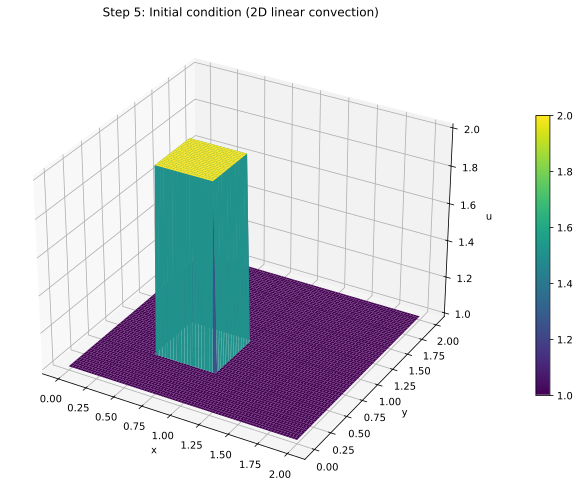

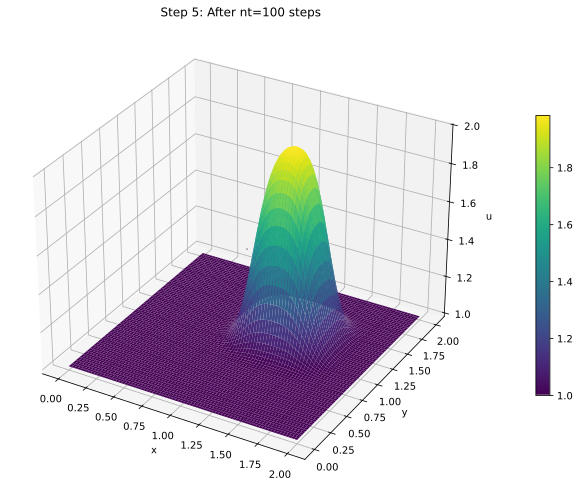

In [20]:
nx = 81
ny = 81
nt = 100
c = 1.0

dx = 2.0 / (nx - 1)
dy = 2.0 / (ny - 1)
sigma = 0.2
dt = sigma * min(dx, dy) / c

x = np.linspace(0, 2, nx)
y = np.linspace(0, 2, ny)
X, Y = np.meshgrid(x, y)

u = np.ones((ny, nx))
u[int(0.5/dy):int(1.0/dy)+1, int(0.5/dx):int(1.0/dx)+1] = 2.0

plot2d_surface(X, Y, u, title="Step 5: Initial condition (2D linear convection)", zlabel="u")

for n in range(nt):
    un = u.copy()
    u[1:-1, 1:-1] = (un[1:-1, 1:-1]
                     - c * dt/dx * (un[1:-1, 1:-1] - un[1:-1, 0:-2])
                     - c * dt/dy * (un[1:-1, 1:-1] - un[0:-2, 1:-1]))

    # BCs
    u[0, :]  = 1
    u[-1, :] = 1
    u[:, 0]  = 1
    u[:, -1] = 1

plot2d_surface(X, Y, u, title=f"Step 5: After nt={nt} steps", zlabel="u")


## Step 6 — 2D Nonlinear Convection

Now we advect **two velocity components** $u(x,y,t)$ and $v(x,y,t)$:


\begin{aligned}
\frac{\partial u}{\partial t} + u\frac{\partial u}{\partial x} + v\frac{\partial u}{\partial y} &= 0,\\
\frac{\partial v}{\partial t} + u\frac{\partial v}{\partial x} + v\frac{\partial v}{\partial y} &= 0.
\end{aligned}


This is essentially “nonlinear transport” in 2D. We use upwind differences.

> **Note:** In this step there is **no pressure** and **no viscosity** yet.


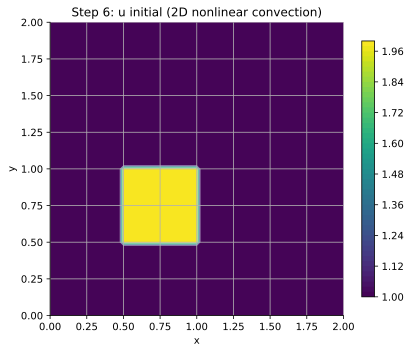

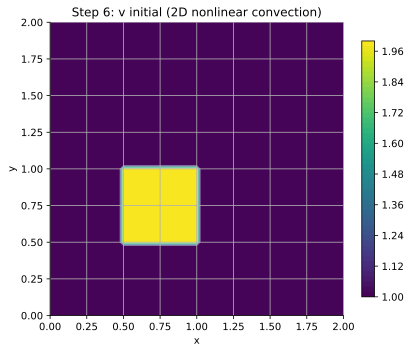

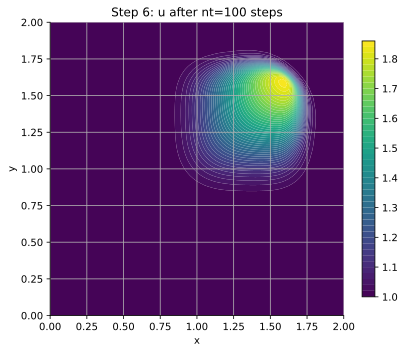

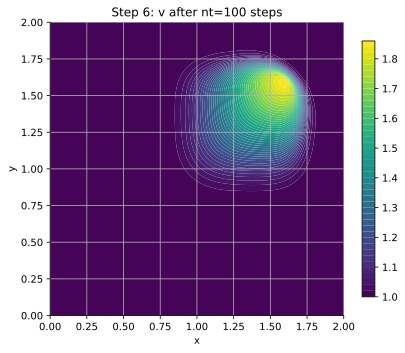

In [21]:
nx = 81
ny = 81
nt = 100

dx = 2.0 / (nx - 1)
dy = 2.0 / (ny - 1)
sigma = 0.2
dt = sigma * min(dx, dy)

x = np.linspace(0, 2, nx)
y = np.linspace(0, 2, ny)
X, Y = np.meshgrid(x, y)

u = np.ones((ny, nx))
v = np.ones((ny, nx))

u[int(0.5/dy):int(1.0/dy)+1, int(0.5/dx):int(1.0/dx)+1] = 2.0
v[int(0.5/dy):int(1.0/dy)+1, int(0.5/dx):int(1.0/dx)+1] = 2.0

plot2d_contour(X, Y, u, title="Step 6: u initial (2D nonlinear convection)")
plot2d_contour(X, Y, v, title="Step 6: v initial (2D nonlinear convection)")

for n in range(nt):
    un = u.copy()
    vn = v.copy()

    u[1:-1, 1:-1] = (un[1:-1, 1:-1]
                     - (un[1:-1, 1:-1] * dt/dx) * (un[1:-1, 1:-1] - un[1:-1, 0:-2])
                     - (vn[1:-1, 1:-1] * dt/dy) * (un[1:-1, 1:-1] - un[0:-2, 1:-1]))

    v[1:-1, 1:-1] = (vn[1:-1, 1:-1]
                     - (un[1:-1, 1:-1] * dt/dx) * (vn[1:-1, 1:-1] - vn[1:-1, 0:-2])
                     - (vn[1:-1, 1:-1] * dt/dy) * (vn[1:-1, 1:-1] - vn[0:-2, 1:-1]))

    # BCs
    u[0, :]  = 1; u[-1, :] = 1; u[:, 0]  = 1; u[:, -1] = 1
    v[0, :]  = 1; v[-1, :] = 1; v[:, 0]  = 1; v[:, -1] = 1

plot2d_contour(X, Y, u, title=f"Step 6: u after nt={nt} steps")
plot2d_contour(X, Y, v, title=f"Step 6: v after nt={nt} steps")


## Step 7 — 2D Diffusion

Diffusion in 2D:

$$
\frac{\partial u}{\partial t} = \nu\left(\frac{\partial^2 u}{\partial x^2}+\frac{\partial^2 u}{\partial y^2}\right).
$$

### Discretization (explicit)
$$
u_{i,j}^{n+1} = u_{i,j}^{n} + \nu\Delta t\left(
\frac{u_{i+1,j}^n - 2u_{i,j}^n + u_{i-1,j}^n}{\Delta x^2} +
\frac{u_{i,j+1}^n - 2u_{i,j}^n + u_{i,j-1}^n}{\Delta y^2}
\right).
$$

### Stability
A typical sufficient condition is:

$$
\nu\Delta t\left(\frac{1}{\Delta x^2}+\frac{1}{\Delta y^2}\right) \lesssim \frac{1}{2}.
$$


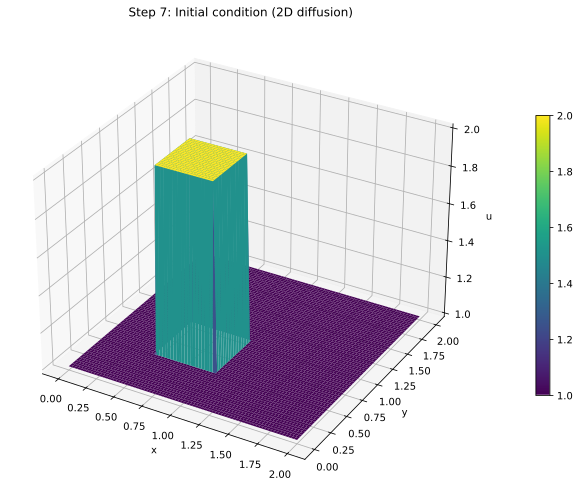

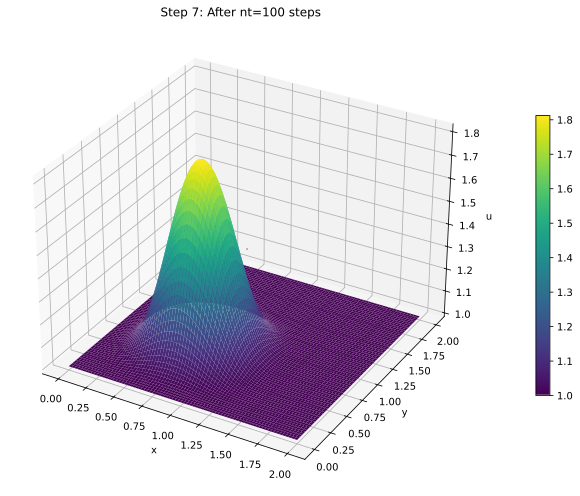

In [22]:
nx = 81
ny = 81
nt = 100
nu = 0.1

dx = 2.0 / (nx - 1)
dy = 2.0 / (ny - 1)
sigma = 0.2
dt = sigma * min(dx, dy)**2 / nu

x = np.linspace(0, 2, nx)
y = np.linspace(0, 2, ny)
X, Y = np.meshgrid(x, y)

u = np.ones((ny, nx))
u[int(0.5/dy):int(1.0/dy)+1, int(0.5/dx):int(1.0/dx)+1] = 2.0

plot2d_surface(X, Y, u, title="Step 7: Initial condition (2D diffusion)", zlabel="u")

for n in range(nt):
    un = u.copy()
    u[1:-1, 1:-1] = (un[1:-1, 1:-1]
                     + nu * dt/dx**2 * (un[1:-1, 2:] - 2*un[1:-1, 1:-1] + un[1:-1, 0:-2])
                     + nu * dt/dy**2 * (un[2:, 1:-1] - 2*un[1:-1, 1:-1] + un[0:-2, 1:-1]))
    u[0, :]  = 1; u[-1, :] = 1; u[:, 0]  = 1; u[:, -1] = 1

plot2d_surface(X, Y, u, title=f"Step 7: After nt={nt} steps", zlabel="u")


## Step 8 — 2D Burgers’ Equations

Add diffusion to the 2D nonlinear convection system:


\begin{aligned}
\frac{\partial u}{\partial t} + u\frac{\partial u}{\partial x} + v\frac{\partial u}{\partial y} &= \nu\left(\frac{\partial^2 u}{\partial x^2}+\frac{\partial^2 u}{\partial y^2}\right),\\
\frac{\partial v}{\partial t} + u\frac{\partial v}{\partial x} + v\frac{\partial v}{\partial y} &= \nu\left(\frac{\partial^2 v}{\partial x^2}+\frac{\partial^2 v}{\partial y^2}\right).
\end{aligned}


This is a classic nonlinear + dissipative system and a stepping stone toward Navier–Stokes.


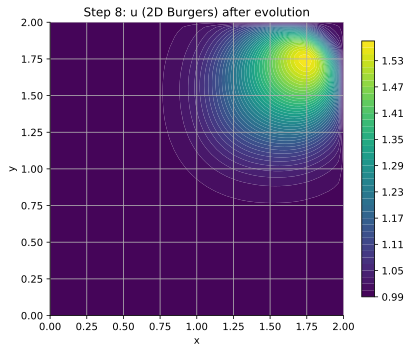

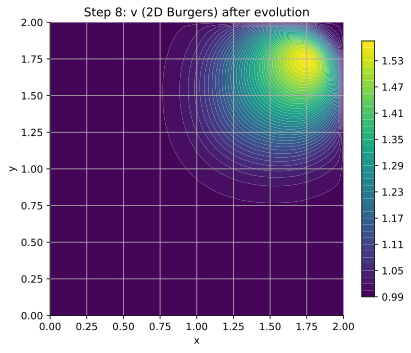

In [23]:
nx = 61
ny = 61
nt = 100
nu = 0.01

dx = 2.0 / (nx - 1)
dy = 2.0 / (ny - 1)
sigma = 0.2
dt = sigma * min(dx, dy)

x = np.linspace(0, 2, nx)
y = np.linspace(0, 2, ny)
X, Y = np.meshgrid(x, y)

u = np.ones((ny, nx))
v = np.ones((ny, nx))
u[int(0.5/dy):int(1.0/dy)+1, int(0.5/dx):int(1.0/dx)+1] = 2.0
v[int(0.5/dy):int(1.0/dy)+1, int(0.5/dx):int(1.0/dx)+1] = 2.0

for n in range(nt):
    un = u.copy()
    vn = v.copy()

    u[1:-1, 1:-1] = (un[1:-1, 1:-1]
                     - (un[1:-1, 1:-1] * dt/dx) * (un[1:-1, 1:-1] - un[1:-1, 0:-2])
                     - (vn[1:-1, 1:-1] * dt/dy) * (un[1:-1, 1:-1] - un[0:-2, 1:-1])
                     + nu * dt/dx**2 * (un[1:-1, 2:] - 2*un[1:-1, 1:-1] + un[1:-1, 0:-2])
                     + nu * dt/dy**2 * (un[2:, 1:-1] - 2*un[1:-1, 1:-1] + un[0:-2, 1:-1]))

    v[1:-1, 1:-1] = (vn[1:-1, 1:-1]
                     - (un[1:-1, 1:-1] * dt/dx) * (vn[1:-1, 1:-1] - vn[1:-1, 0:-2])
                     - (vn[1:-1, 1:-1] * dt/dy) * (vn[1:-1, 1:-1] - vn[0:-2, 1:-1])
                     + nu * dt/dx**2 * (vn[1:-1, 2:] - 2*vn[1:-1, 1:-1] + vn[1:-1, 0:-2])
                     + nu * dt/dy**2 * (vn[2:, 1:-1] - 2*vn[1:-1, 1:-1] + vn[0:-2, 1:-1]))

    u[0, :]  = 1; u[-1, :] = 1; u[:, 0]  = 1; u[:, -1] = 1
    v[0, :]  = 1; v[-1, :] = 1; v[:, 0]  = 1; v[:, -1] = 1

plot2d_contour(X, Y, u, title="Step 8: u (2D Burgers) after evolution")
plot2d_contour(X, Y, v, title="Step 8: v (2D Burgers) after evolution")


## Step 9 — Laplace Equation

Laplace’s equation appears in steady-state diffusion, potential flow, electrostatics, etc.:

$$
\frac{\partial^2 p}{\partial x^2} + \frac{\partial^2 p}{\partial y^2} = 0.
$$

We solve it iteratively using a simple Jacobi-like update.

### Discretization
$$
p_{i,j} = \frac{1}{2(\Delta x^2+\Delta y^2)}\Big[
\Delta y^2(p_{i+1,j}+p_{i-1,j}) + \Delta x^2(p_{i,j+1}+p_{i,j-1})
\Big].
$$


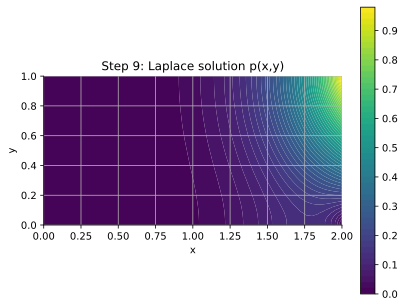

In [24]:
nx = 51
ny = 51

dx = 2.0 / (nx - 1)
dy = 1.0 / (ny - 1)

x = np.linspace(0, 2, nx)
y = np.linspace(0, 1, ny)
X, Y = np.meshgrid(x, y)

p = np.zeros((ny, nx))

# Boundary conditions (example)
# p = 0 at x=0, p = y at x=2, dp/dy = 0 at y=0 and y=1
p[:, 0]  = 0
p[:, -1] = y

def laplace2d(p, nit=500):
    pn = np.empty_like(p)
    for it in range(nit):
        pn[:] = p

        p[1:-1, 1:-1] = ((dy**2 * (pn[1:-1, 2:] + pn[1:-1, 0:-2]) +
                          dx**2 * (pn[2:, 1:-1] + pn[0:-2, 1:-1]))
                         / (2*(dx**2 + dy**2)))

        # Re-apply BCs every iteration
        p[:, 0]  = 0
        p[:, -1] = y
        p[0, :]  = p[1, :]     # dp/dy=0 at y=0
        p[-1, :] = p[-2, :]    # dp/dy=0 at y=1

    return p

p = laplace2d(p, nit=800)
plot2d_contour(X, Y, p, title="Step 9: Laplace solution p(x,y)", cmap=cm.viridis)


## Step 10 — Poisson Equation

Poisson’s equation adds a source term \(b(x,y)\):

$$
\frac{\partial^2 p}{\partial x^2} + \frac{\partial^2 p}{\partial y^2} = b.
$$

In incompressible CFD, a Poisson equation for pressure is central to enforcing $\nabla\cdot\mathbf{u}=0$.

We again use an iterative solver (Jacobi-like).


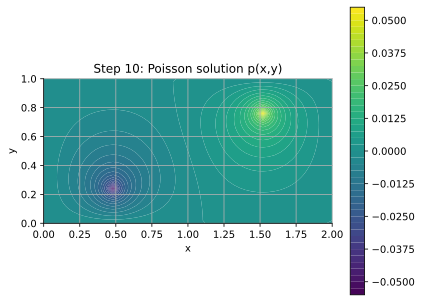

In [25]:
nx = 51
ny = 51
dx = 2.0 / (nx - 1)
dy = 1.0 / (ny - 1)

x = np.linspace(0, 2, nx)
y = np.linspace(0, 1, ny)
X, Y = np.meshgrid(x, y)

p = np.zeros((ny, nx))
b = np.zeros((ny, nx))

# Example point sources
b[int(ny/4), int(nx/4)] =  100
b[int(3*ny/4), int(3*nx/4)] = -100

def poisson2d(p, b, nit=800):
    pn = np.empty_like(p)
    for it in range(nit):
        pn[:] = p
        p[1:-1, 1:-1] = (((pn[1:-1, 2:] + pn[1:-1, 0:-2]) * dy**2 +
                          (pn[2:, 1:-1] + pn[0:-2, 1:-1]) * dx**2 -
                          b[1:-1, 1:-1] * dx**2 * dy**2)
                         / (2*(dx**2 + dy**2)))

        # Dirichlet BCs (example)
        p[0, :]  = 0
        p[-1, :] = 0
        p[:, 0]  = 0
        p[:, -1] = 0
    return p

p = poisson2d(p, b, nit=1200)
plot2d_contour(X, Y, p, title="Step 10: Poisson solution p(x,y)", cmap=cm.viridis)


## Step 11 — Incompressible Navier–Stokes: Lid-Driven Cavity

Now we solve the **2D incompressible Navier–Stokes equations**:


\begin{aligned}
\frac{\partial u}{\partial t} + u\frac{\partial u}{\partial x} + v\frac{\partial u}{\partial y} &= -\frac{1}{\rho}\frac{\partial p}{\partial x} + \nu\left(\frac{\partial^2 u}{\partial x^2}+\frac{\partial^2 u}{\partial y^2}\right),\\
\frac{\partial v}{\partial t} + u\frac{\partial v}{\partial x} + v\frac{\partial v}{\partial y} &= -\frac{1}{\rho}\frac{\partial p}{\partial y} + \nu\left(\frac{\partial^2 v}{\partial x^2}+\frac{\partial^2 v}{\partial y^2}\right),\\
\frac{\partial u}{\partial x} + \frac{\partial v}{\partial y} &= 0.
\end{aligned}


### Projection idea
1. Predict a tentative velocity from advection + diffusion (ignoring pressure).
2. Solve a **pressure Poisson equation** derived from enforcing \(\nabla\cdot\mathbf{u}=0\).
3. Correct velocity using the pressure gradient.

### Boundary conditions (lid-driven cavity)
- Velocity is zero on all walls **except** the top lid:
  - `u = 1` at `y = 2` (top)
  - `u = v = 0` elsewhere

This produces a circulating vortex and is a standard benchmark.


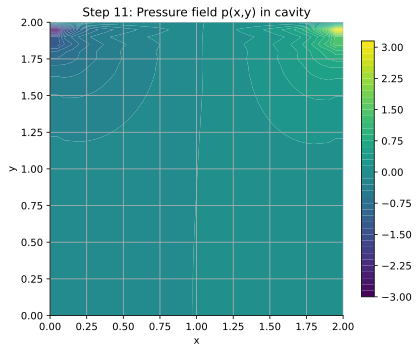

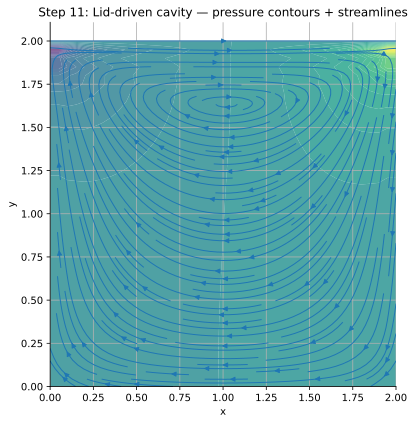

In [26]:
nx = 41
ny = 41
nt = 300      # time steps
nit = 50      # pressure iterations each step

dx = 2.0 / (nx - 1)
dy = 2.0 / (ny - 1)

rho = 1.0
nu = 0.1
dt = 0.001

x = np.linspace(0, 2, nx)
y = np.linspace(0, 2, ny)
X, Y = np.meshgrid(x, y)

u = np.zeros((ny, nx))
v = np.zeros((ny, nx))
p = np.zeros((ny, nx))
b = np.zeros((ny, nx))

def build_up_b(b, rho, dt, u, v, dx, dy):
    """Build the RHS of the pressure Poisson equation."""
    b[1:-1, 1:-1] = (rho * (1/dt * (
                            (u[1:-1, 2:] - u[1:-1, 0:-2]) / (2*dx) +
                            (v[2:, 1:-1] - v[0:-2, 1:-1]) / (2*dy)
                        ) -
                        ((u[1:-1, 2:] - u[1:-1, 0:-2]) / (2*dx))**2 -
                        2 * ((u[2:, 1:-1] - u[0:-2, 1:-1]) / (2*dy) *
                             (v[1:-1, 2:] - v[1:-1, 0:-2]) / (2*dx)) -
                        ((v[2:, 1:-1] - v[0:-2, 1:-1]) / (2*dy))**2))
    return b

def pressure_poisson(p, dx, dy, b, nit):
    pn = np.empty_like(p)
    for it in range(nit):
        pn[:] = p
        p[1:-1, 1:-1] = (((pn[1:-1, 2:] + pn[1:-1, 0:-2]) * dy**2 +
                          (pn[2:, 1:-1] + pn[0:-2, 1:-1]) * dx**2) /
                         (2*(dx**2 + dy**2)) -
                         (dx**2 * dy**2)/(2*(dx**2 + dy**2)) * b[1:-1, 1:-1])

        # Pressure BCs for cavity:
        p[:, -1] = p[:, -2]  # dp/dx = 0 at x=2
        p[:,  0] = p[:,  1]  # dp/dx = 0 at x=0
        p[0,  :] = p[1,  :]  # dp/dy = 0 at y=0
        p[-1, :] = 0         # p = 0 at y=2 (reference)
    return p

for n in range(nt):
    un = u.copy()
    vn = v.copy()

    b = build_up_b(b, rho, dt, u, v, dx, dy)
    p = pressure_poisson(p, dx, dy, b, nit)

    # Velocity update (explicit)
    u[1:-1, 1:-1] = (un[1:-1, 1:-1]
                     - un[1:-1, 1:-1] * dt/dx * (un[1:-1, 1:-1] - un[1:-1, 0:-2])
                     - vn[1:-1, 1:-1] * dt/dy * (un[1:-1, 1:-1] - un[0:-2, 1:-1])
                     - dt/(2*rho*dx) * (p[1:-1, 2:] - p[1:-1, 0:-2])
                     + nu * (dt/dx**2 * (un[1:-1, 2:] - 2*un[1:-1, 1:-1] + un[1:-1, 0:-2]) +
                             dt/dy**2 * (un[2:, 1:-1] - 2*un[1:-1, 1:-1] + un[0:-2, 1:-1])))

    v[1:-1, 1:-1] = (vn[1:-1, 1:-1]
                     - un[1:-1, 1:-1] * dt/dx * (vn[1:-1, 1:-1] - vn[1:-1, 0:-2])
                     - vn[1:-1, 1:-1] * dt/dy * (vn[1:-1, 1:-1] - vn[0:-2, 1:-1])
                     - dt/(2*rho*dy) * (p[2:, 1:-1] - p[0:-2, 1:-1])
                     + nu * (dt/dx**2 * (vn[1:-1, 2:] - 2*vn[1:-1, 1:-1] + vn[1:-1, 0:-2]) +
                             dt/dy**2 * (vn[2:, 1:-1] - 2*vn[1:-1, 1:-1] + vn[0:-2, 1:-1])))

    # Velocity BCs
    u[0, :]  = 0
    u[:, 0]  = 0
    u[:, -1] = 0
    u[-1, :] = 1  # moving lid

    v[0, :]  = 0
    v[-1, :] = 0
    v[:, 0]  = 0
    v[:, -1] = 0

# Visualize: pressure + velocity field
plot2d_contour(X, Y, p, title="Step 11: Pressure field p(x,y) in cavity")

fig, ax = plt.subplots(figsize=(8, 6), dpi=110)
ax.contourf(X, Y, p, levels=50, cmap=cm.viridis, alpha=0.8)
ax.streamplot(X, Y, u, v, density=1.6, linewidth=1)
ax.set_title("Step 11: Lid-driven cavity — pressure contours + streamlines")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_aspect("equal")
fig.tight_layout()
plt.show()


## Step 12 — Incompressible Navier–Stokes: Channel Flow (Pressure-Driven)

We solve the same incompressible Navier–Stokes system, but now in a channel with a constant pressure gradient
(or equivalently a body force) driving flow.

A common pedagogical setup:
- Periodic-like condition in x can be approximated by enforcing pressure BCs with a fixed $\Delta p$ across the domain.
- No-slip on the top and bottom walls.

Below is a compact explicit solver with pressure Poisson iterations, following the same projection idea as Step 11.


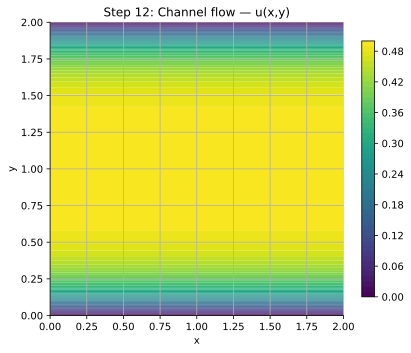

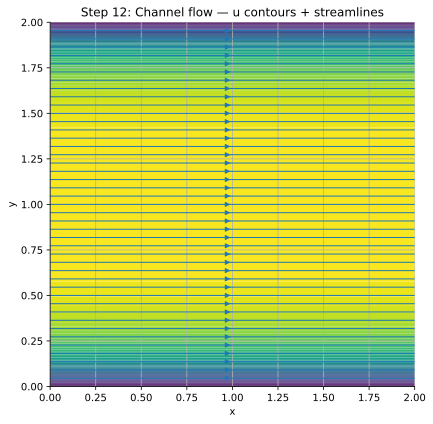

In [27]:
nx = 41
ny = 41
nt = 500
nit = 50

dx = 2.0 / (nx - 1)
dy = 2.0 / (ny - 1)

rho = 1.0
nu = 0.1
dt = 0.001

F = 1.0  # body force driving the flow in x-direction (acts like a pressure gradient)

x = np.linspace(0, 2, nx)
y = np.linspace(0, 2, ny)
X, Y = np.meshgrid(x, y)

u = np.zeros((ny, nx))
v = np.zeros((ny, nx))
p = np.zeros((ny, nx))
b = np.zeros((ny, nx))

def build_up_b_channel(b, rho, dt, u, v, dx, dy):
    b[1:-1, 1:-1] = (rho * (1/dt * (
                            (u[1:-1, 2:] - u[1:-1, 0:-2]) / (2*dx) +
                            (v[2:, 1:-1] - v[0:-2, 1:-1]) / (2*dy)
                        ) -
                        ((u[1:-1, 2:] - u[1:-1, 0:-2]) / (2*dx))**2 -
                        2 * ((u[2:, 1:-1] - u[0:-2, 1:-1]) / (2*dy) *
                             (v[1:-1, 2:] - v[1:-1, 0:-2]) / (2*dx)) -
                        ((v[2:, 1:-1] - v[0:-2, 1:-1]) / (2*dy))**2))
    return b

def pressure_poisson_channel(p, dx, dy, b, nit):
    pn = np.empty_like(p)
    for it in range(nit):
        pn[:] = p
        p[1:-1, 1:-1] = (((pn[1:-1, 2:] + pn[1:-1, 0:-2]) * dy**2 +
                          (pn[2:, 1:-1] + pn[0:-2, 1:-1]) * dx**2) /
                         (2*(dx**2 + dy**2)) -
                         (dx**2 * dy**2)/(2*(dx**2 + dy**2)) * b[1:-1, 1:-1])

        # Pressure BCs for channel (approximate periodic in x)
        p[:, -1] = p[:, -2]   # dp/dx = 0 at x=2
        p[:,  0] = p[:,  1]   # dp/dx = 0 at x=0
        p[0,  :] = p[1,  :]   # dp/dy = 0 at y=0
        p[-1, :] = p[-2, :]   # dp/dy = 0 at y=2
    return p

for n in range(nt):
    un = u.copy()
    vn = v.copy()

    b = build_up_b_channel(b, rho, dt, u, v, dx, dy)
    p = pressure_poisson_channel(p, dx, dy, b, nit)

    u[1:-1, 1:-1] = (un[1:-1, 1:-1]
                     - un[1:-1, 1:-1] * dt/dx * (un[1:-1, 1:-1] - un[1:-1, 0:-2])
                     - vn[1:-1, 1:-1] * dt/dy * (un[1:-1, 1:-1] - un[0:-2, 1:-1])
                     - dt/(2*rho*dx) * (p[1:-1, 2:] - p[1:-1, 0:-2])
                     + nu * (dt/dx**2 * (un[1:-1, 2:] - 2*un[1:-1, 1:-1] + un[1:-1, 0:-2]) +
                             dt/dy**2 * (un[2:, 1:-1] - 2*un[1:-1, 1:-1] + un[0:-2, 1:-1]))
                     + F * dt)

    v[1:-1, 1:-1] = (vn[1:-1, 1:-1]
                     - un[1:-1, 1:-1] * dt/dx * (vn[1:-1, 1:-1] - vn[1:-1, 0:-2])
                     - vn[1:-1, 1:-1] * dt/dy * (vn[1:-1, 1:-1] - vn[0:-2, 1:-1])
                     - dt/(2*rho*dy) * (p[2:, 1:-1] - p[0:-2, 1:-1])
                     + nu * (dt/dx**2 * (vn[1:-1, 2:] - 2*vn[1:-1, 1:-1] + vn[1:-1, 0:-2]) +
                             dt/dy**2 * (vn[2:, 1:-1] - 2*vn[1:-1, 1:-1] + vn[0:-2, 1:-1])))

    # Velocity BCs: no-slip at y=0 and y=2
    u[0, :]  = 0
    u[-1, :] = 0
    v[0, :]  = 0
    v[-1, :] = 0

    # "Periodic-ish" in x: copy from near-boundary (simple approximation)
    u[:, 0]  = u[:, 1]
    u[:, -1] = u[:, -2]
    v[:, 0]  = v[:, 1]
    v[:, -1] = v[:, -2]

plot2d_contour(X, Y, u, title="Step 12: Channel flow — u(x,y)")
fig, ax = plt.subplots(figsize=(8, 6), dpi=110)
ax.contourf(X, Y, u, levels=50, cmap=cm.viridis)
ax.streamplot(X, Y, u, v, density=1.5, linewidth=1)
ax.set_title("Step 12: Channel flow — u contours + streamlines")
ax.set_xlabel("x"); ax.set_ylabel("y")
ax.set_aspect("equal")
fig.tight_layout()
plt.show()


---

## Notes, extensions, and “next steps”
- Replace Forward Euler with a higher-order time integrator (RK2/RK3).
- Use higher-order spatial schemes (QUICK/WENO) for sharper convection.
- Swap the simple pressure solver for a faster method (SOR, multigrid).
- Validate with known solutions (Taylor–Green vortex, Poiseuille profile, etc.).
